This is my version of `course4_generative-deep-learning/c4-labs/wk1-lab1-neural-style-transfer.ipynb`

The difference is that here I try to use a customModel where I do the training, unlike the orignal lab where the training its own function. I do this so I can get access to cool things in the model training such as callbacks

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import keras.backend as K
from imageio import mimsave
from tensorflow.keras.models import Model

from IPython.display import display as display_fn
from IPython.display import Image, clear_output

In [2]:
def tensor_to_image(tensor):
    '''converts a tensor to an image'''
    tensor_shape = tf.shape(tensor)
    num_dims = tf.shape(tensor_shape) # number of nested arrays, ie len of tensor_shape
    if num_dims > 3:
        assert tensor_shape[0] == 1 # that we have a batch of one elem
        tensor = tensor[0]
    return tf.keras.preprocessing.image.array_to_img(tensor)

def load_img(img_path):
    '''loads an image from path and scales it to 512'''
    max_dim = 512
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.shape(img)[:-1] # exclude the num_channels 
    shape = tf.cast(shape, tf.float32)
    longest_dim = max(shape) 
    scale = max_dim / longest_dim # normalization scale
    new_shape = tf.cast(shape*scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :] # this is like expand_dims(axis=0)
    img = tf.image.convert_image_dtype(img, tf.uint8)

    return img

def load_content_and_style_images(content_path, style_path):
    content_img = load_img(content_path)
    style_image = load_img(style_path)
    return content_img, style_image


In [3]:
def imshow(image, title=None):
  '''displays an image with a corresponding title'''
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)
    
    
def show_images_with_objects(images, titles=[]):
  '''displays a row of images with corresponding titles'''
  if len(images) != len(titles):
    return

  plt.figure(figsize=(20, 12))
  for idx, (image, title) in enumerate(zip(images, titles)):
    plt.subplot(1, len(images), idx + 1)
    plt.xticks([])
    plt.yticks([])
    imshow(image, title)


def display_gif(gif_path):
  '''displays the generated images as an animated gif'''
  with open(gif_path,'rb') as f:
    display_fn(Image(data=f.read(), format='png'))


def create_gif(gif_path, images):
  '''creates animation of generated images'''
  mimsave(gif_path, images, fps=1)
  
  return gif_path


def clip_image_values(image, min_value=0.0, max_value=255.0):
  '''clips the image pixel values by the given min and max'''
  return tf.clip_by_value(image, clip_value_min=min_value, clip_value_max=max_value)


def preprocess_image(image):
  '''centers the pixel values of a given image to use with VGG-19'''
  image = tf.cast(image, dtype=tf.float32)
  image = tf.keras.applications.vgg19.preprocess_input(image)

  return image

In [4]:
IMAGE_DIR = 'images'

# create directory
!mkdir {IMAGE_DIR}

# download images to the directory you just created
# !wget -q -O ./images/cafe.jpg https://cdn.pixabay.com/photo/2018/07/14/15/27/cafe-3537801_1280.jpg
# !wget -q -O ./images/swan.jpg https://cdn.pixabay.com/photo/2017/02/28/23/00/swan-2107052_1280.jpg
# !wget -q -O ./images/tnj.jpg https://i.dawn.com/large/2019/10/5db6a03a4c7e3.jpg
# !wget -q -O ./images/rudolph.jpg https://cdn.pixabay.com/photo/2015/09/22/12/21/rudolph-951494_1280.jpg
# !wget -q -O ./images/dynamite.jpg https://cdn.pixabay.com/photo/2015/10/13/02/59/animals-985500_1280.jpg
# !wget -q -O ./images/painting.jpg https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg
# !wget -q -O ./images/pid_curves.jpg https://i.pinimg.com/474x/c8/d4/1f/c8d41f6fdd023683b268d512ee765e91.jpg
# !wget -q -O ./images/pid_curves2.jpg https://slideplayer.com/slide/1577066/5/images/3/Impact+of+Controller+Tuning.jpg
# !wget -q -O ./images/paper.jpg https://cdn.pixabay.com/photo/2018/12/27/12/59/old-3897565_960_720.jpg
# !wget -q -O ./images/paper2.jpg https://cdn.pixabay.com/photo/2014/06/21/10/20/old-373719_960_720.jpg


print("image files you can choose from: ")
!ls images


mkdir: cannot create directory ‘images’: File exists
image files you can choose from: 
cafe.jpg      painting.jpg  paper.jpg	     pid_curves.jpg  swan.jpg
dynamite.jpg  paper2.jpg    pid_curves2.jpg  rudolph.jpg     tnj.jpg


images/swan.jpg images/painting.jpg


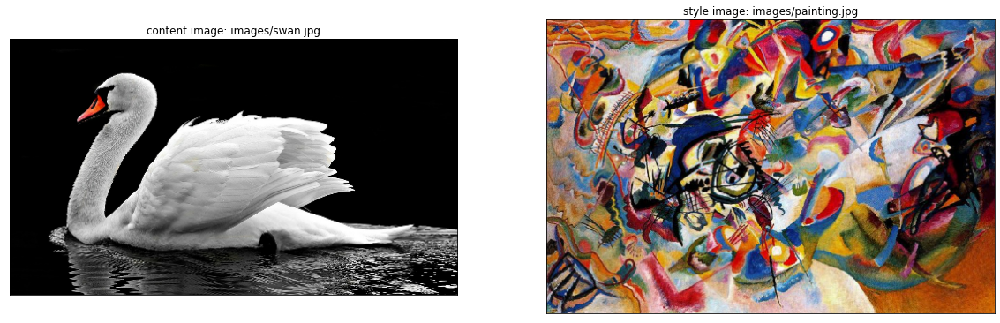

In [5]:
# set default images
content_path = f'{IMAGE_DIR}/swan.jpg'
style_path = f'{IMAGE_DIR}/painting.jpg'

print(content_path, style_path)
# display the content and style image
content_image, style_image = load_content_and_style_images(content_path, style_path)
show_images_with_objects([content_image, style_image], 
                         titles=[f'content image: {content_path}',
                                 f'style image: {style_path}'])

In [6]:

# Choose intermediate layers from the network to extract the style and content of the image:

#     For the style layers, you will use the first layer of each convolutional block.

#     For the content layer, you will use the second convolutional layer of the last convolutional block (just one layer)

# We choose lower blocks for style to capture low-level features of the style like the colors.
# and we choose last block conv layer for the content image to capture high level features, like the head-shape of the swan

# style layers of interest
style_layers = ['block1_conv1', 
                'block2_conv1', 
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'] 

# choose the content layer and put in a list
content_layers = ['block5_conv2'] 

# combine the two lists (put the style layers before the content layers)
output_layers = style_layers + content_layers 

# declare auxiliary variables holding the number of style and content layers
NUM_CONTENT_LAYERS = len(content_layers)
NUM_STYLE_LAYERS = len(style_layers)

In [7]:
def vgg_model(layer_names):
  """ Creates a vgg model that outputs the style and content layer activations.
  
  Args:
    layer_names: a list of strings, representing the names of the desired content and style layers
    
  Returns:
    A model that takes the regular vgg19 input and outputs just the content and style layers.
  
  """

  # load the the pretrained VGG, trained on imagenet data
  vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')

  # freeze the weights of the model's layers (make them not trainable)
  vgg.trainable = False
  
  # create a list of layer objects that are specified by layer_names
  outputs = [vgg.get_layer(name).output for name in layer_names]

  # create the model that outputs content and style layers only
  model = tf.keras.Model(inputs=vgg.input, outputs=outputs)

  return model

In [8]:
# clear session to make layer naming consistent if re-running the cell
K.clear_session()

# create a vgg-19 model
vgg = vgg_model(output_layers)
vgg.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [9]:
def get_style_loss(features, targets):
  """Expects two images of dimension h, w, c
  
  Args:
    features: tensor with shape: (height, width, channels)
    targets: tensor with shape: (height, width, channels)

  Returns:
    style loss (scalar)
  """
  # get the average of the squared errors
  style_loss = tf.reduce_mean(tf.square(features - targets))
    
  return style_loss

def get_content_loss(features, targets):
  """Expects two images of dimension h, w, c
  
  Args:
    features: tensor with shape: (height, width, channels)
    targets: tensor with shape: (height, width, channels)
  
  Returns:
    content loss (scalar)
  """
  # get the sum of the squared error multiplied by a scaling factor
  content_loss = 0.5 * tf.reduce_sum(tf.square(features - targets))
    
  return content_loss


  

In [10]:
def gram_matrix(input_tensor):
  """ Calculates the gram matrix and divides by the number of locations
  Args:
    input_tensor: tensor of shape (batch, height, width, channels)
    
  Returns:
    scaled_gram: gram matrix divided by the number of locations
  """

  # calculate the gram matrix of the input tensor
  gram = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor) 

  # get the height and width of the input tensor
  input_shape = tf.shape(input_tensor) 
  height = input_shape[1] 
  width = input_shape[2] 

  # get the number of locations (height times width), and cast it as a tf.float32
  num_locations = tf.cast(height * width, tf.float32)

  # scale the gram matrix by dividing by the number of locations
  scaled_gram = gram / num_locations
    
  return scaled_gram

In [11]:
#  For each style layer, calculate the gram matrix.
#  Store these results in a list and return it.
def get_style_image_features(image):  
  """ Get the style image features
  
  Args:
    image: an input image
    
  Returns:
    gram_style_features: the style features as gram matrices
  """
  # preprocess the image using the given preprocessing function
  preprocessed_style_image = preprocess_image(image) 

  # get the outputs from the custom vgg model that you created using vgg_model()
  outputs = vgg(preprocessed_style_image) 

  # Get just the style feature layers (exclude the content layer)
  style_outputs = outputs[:NUM_STYLE_LAYERS] 

  # for each style layer, calculate the gram matrix for that layer and store these results in a list
  gram_style_features = [gram_matrix(style_layer) for style_layer in style_outputs] 

  return gram_style_features


def get_content_image_features(image):
  """ Get the content image features
  
  Args:
    image: an input image
    
  Returns:
    content_outputs: the content features of the image
  """
  # preprocess the image
  preprocessed_content_image = preprocess_image(image)
    
  # get the outputs from the vgg model
  outputs = vgg(preprocessed_content_image) 

  # get the content layers of the outputs
  content_outputs = outputs[NUM_STYLE_LAYERS:]

  # return the content layer outputs of the content image
  return content_outputs

In [62]:
def get_style_content_loss(style_targets, style_outputs, content_targets, 
                           content_outputs, style_weight, content_weight):
    """ Combine the style and content loss

    Args:
    style_targets: style features of the style image
    style_outputs: style features of the generated image
    content_targets: content features of the content image
    content_outputs: content features of the generated image
    style_weight: weight given to the style loss
    content_weight: weight given to the content loss

    Returns:
    total_loss: the combined style and content loss

    """
    # we use add_n vs add https://stackoverflow.com/questions/50705859/python-sum-on-array-of-tensors-vs-tf-add-n/50706126

    # sum of the style losses
    style_loss = tf.add_n([ get_style_loss(style_output, style_target)
                            for style_output, style_target in zip(style_outputs, style_targets)])

    # Sum up the content losses
    content_loss = tf.add_n([get_content_loss(content_output, content_target)
                            for content_output, content_target in zip(content_outputs, content_targets)])

    # scale the style loss by multiplying by the style weight and dividing by the number of style layers
    style_loss = style_loss * style_weight / NUM_STYLE_LAYERS 

    # scale the content loss by multiplying by the content weight and dividing by the number of content layers
    content_loss = content_loss * content_weight / NUM_CONTENT_LAYERS 

    # sum up the style and content losses
    total_loss = style_loss + content_loss 

    return total_loss, style_loss, content_loss

In [46]:
a = tf.constant(0)
a.shape == tf.TensorShape([])

True

Epoch 1/10
1/1 [==============================] - 0s 188ms/step - total_loss: 1.1293 - style_loss: 1.1293 - content_loss: 0.0000e+00
Epoch 2/10
1/1 [==============================] - 0s 186ms/step - total_loss: 0.9286 - style_loss: 0.9286 - content_loss: 9.1826e-15
Epoch 3/10
1/1 [==============================] - 0s 189ms/step - total_loss: 0.6268 - style_loss: 0.6268 - content_loss: 2.7972e-14
Epoch 4/10
1/1 [==============================] - 0s 190ms/step - total_loss: 0.3884 - style_loss: 0.3884 - content_loss: 4.1105e-14
Epoch 5/10
1/1 [==============================] - 0s 185ms/step - total_loss: 0.2532 - style_loss: 0.2532 - content_loss: 5.0689e-14
Epoch 6/10
1/1 [==============================] - 0s 189ms/step - total_loss: 0.1837 - style_loss: 0.1837 - content_loss: 5.5157e-14
Epoch 7/10
1/1 [==============================] - 0s 190ms/step - total_loss: 0.1472 - style_loss: 0.1472 - content_loss: 5.5193e-14
Epoch 8/10
1/1 [==============================] - 0s 187ms/step - tot

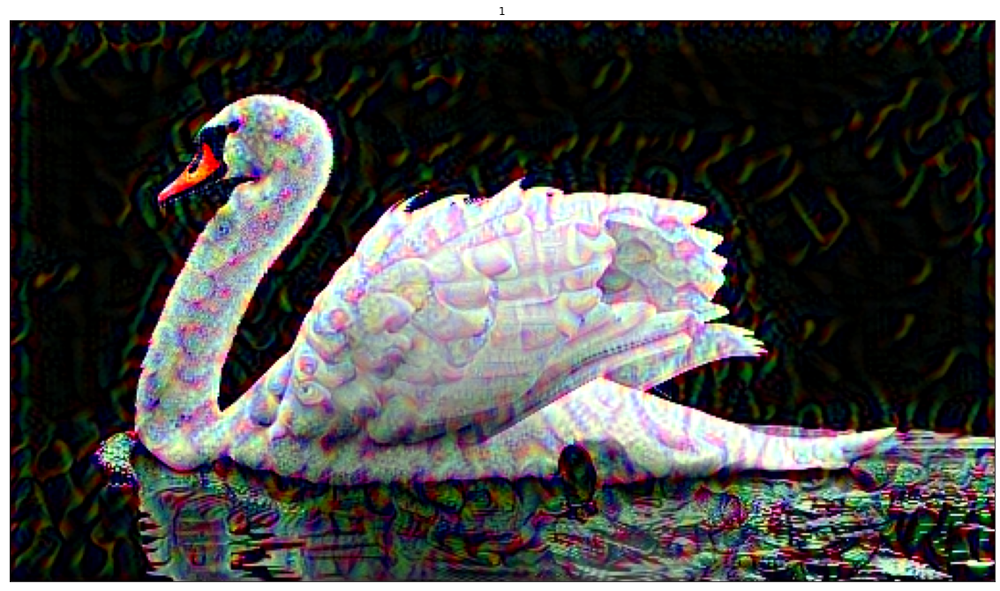

In [89]:
# steps_per_epoch = 100
# style_weight =  1e-4
# content_weight = 1e-32
style_weight =  1e-11
content_weight = 1e-22
generated_images = []
optimizer = tf.optimizers.Adam(
    tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=30.0, decay_steps=100, decay_rate=0.80
    )
)
iterations_counter = 0
generated_image = tf.constant(0)

class StyleTransferModel(Model):
    def train_step(self, data):
        global iterations_counter, generated_image
        content_image = data[0]
        style_image = data[1]

        # style and content features for original style image and content image
        style_targets = get_style_image_features(style_image)
        content_targets = get_content_image_features(content_image)

        # start with the original content image
        if generated_image.shape == tf.TensorShape([]):
            generated_image = tf.cast(content_image, dtype=tf.float32)
            generated_image = tf.Variable(generated_image)

        with tf.GradientTape() as tape:
            # compute new style and content features of the generated image to find loss
            style_features = get_style_image_features(generated_image)
            content_features = get_content_image_features(generated_image)
            total_loss, style_loss, content_loss = get_style_content_loss(style_targets, style_features, content_targets, content_features, style_weight, content_weight)
        # partial_derivatives_of_loss_with_respect_to_generated_image
        gradients = tape.gradient(total_loss, generated_image)
        #apply gradient to given image
        self.optimizer.apply_gradients([(gradients, generated_image)])
        generated_image.assign(clip_image_values(generated_image,  min_value=0.0, max_value=255.0))
        iterations_counter += 1

        # append stylized image and return total loss
        # if iterations_counter % 10 == 0:
        generated_images.append(generated_image)
        return {"total_loss":total_loss, "style_loss": style_loss, "content_loss": content_loss}
    
K.clear_session()
model = StyleTransferModel()
model.compile(optimizer=optimizer, run_eagerly=True)
model.fit(content_image, style_image, epochs= 10)
generated_images = [tf.cast(generated_image, dtype=tf.uint8) for generated_image in generated_images]
len(generated_images)


In [ ]:
show_images_with_objects(generated_images[-1], ["1"])

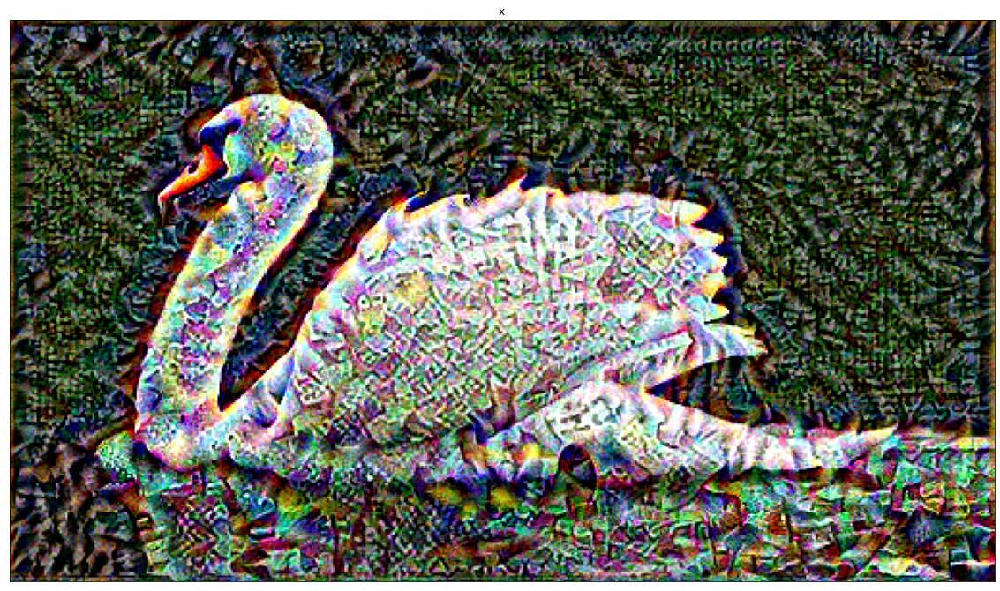

In [80]:
show_images_with_objects(q[-1], ["x"])

# style_weight =  1e-4
# content_weight = 1e-32
# epochs=10

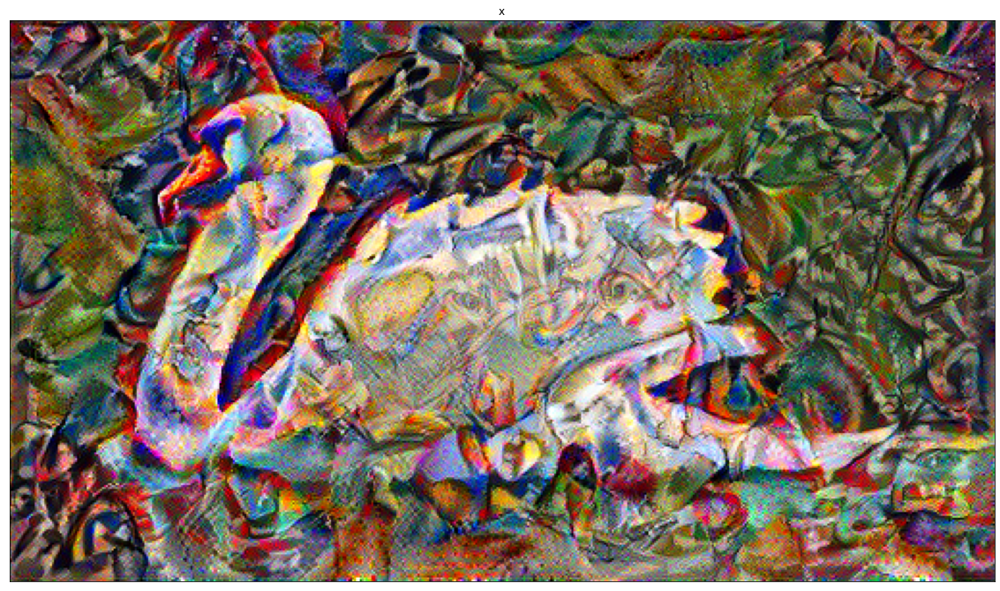

In [67]:
# show_images_with_objects(q, ["x" for x in q])
show_images_with_objects(q[0], ["x"])
# style_weight =  1e-4
# content_weight = 1e-32
# epochs = 500
